# MG MidiAnalysis

In [1]:
import sys
sys.executable

'/home/cipher000/anaconda3/envs/tensorflow1.4/bin/python'

In [23]:
import pretty_midi
import pandas as pd
import numpy as np
# For plotting
import mir_eval.display
import librosa.display
from music21 import *
import matplotlib.pyplot as plt
%matplotlib inline
# For putting audio in the notebook
import IPython.display

import os

In [3]:
midi_data_folder = '/media/cipher000/DATA/Music/MidiWorld/'
midi_output_folder = '../output/'

midi_file = midi_data_folder + 'BelindaCarlisle-IsaPlaceonEarth.mid'

fs = 16000
rate = 16000
start_pitch = 24
end_pitch = 84

### Pretty Midi

In [4]:
# pm = pretty_midi.PrettyMIDI(initial_tempo=80)
pm = pretty_midi.PrettyMIDI(midi_file)

In [5]:
IPython.display.Audio(pm.synthesize(fs=fs), rate=rate)

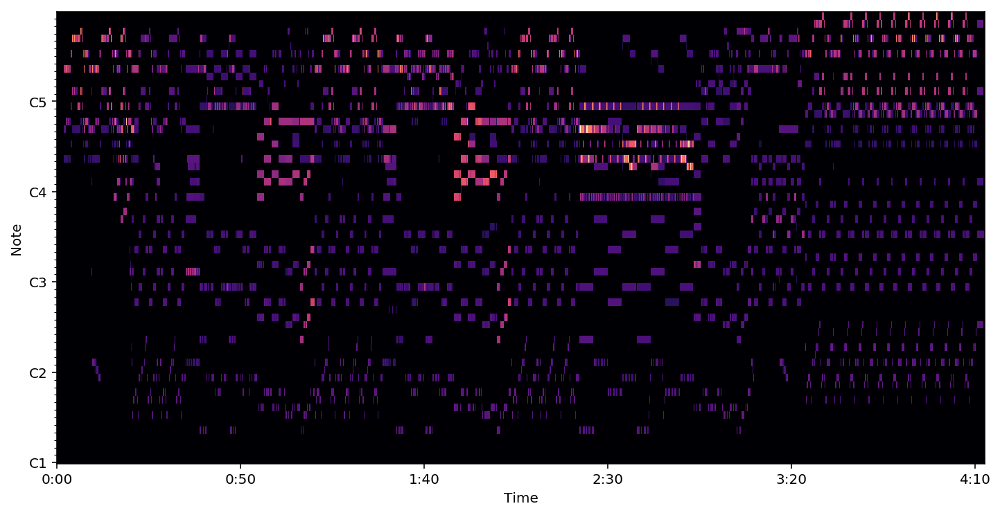

In [6]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=10):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(12, 6))
plot_piano_roll(pm, start_pitch, end_pitch)

In [7]:
pm.instruments

[Instrument(program=16, is_drum=True, name="Heaven Is A Place On Earth"),
 Instrument(program=10, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=11, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=50, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=73, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=33, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=25, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=2, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=29, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=28, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=54, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=101, is_drum=False, name="Heaven Is A Place On Earth"),
 Instrument(program=119, is_drum=False, name="Heaven Is A Place On Earth")]

In [8]:
inst = pretty_midi.Instrument(program=42, is_drum=False, name='my cello')
pm.instruments.append(inst)

In [9]:
velocity = 100
for pitch, start, end in zip([60,62,64],[0.2,0.6,1.0],[1.1,1.7,2.3]):
    inst.notes.append(pretty_midi.Note(velocity,pitch,start,end))
print(inst.notes)

[Note(start=0.200000, end=1.100000, pitch=60, velocity=100), Note(start=0.600000, end=1.700000, pitch=62, velocity=100), Note(start=1.000000, end=2.300000, pitch=64, velocity=100)]


In [10]:
print("Time Signature Changes: {} Instruments: {}".format(len(pm.time_signature_changes), len(pm.instruments)))
instrument_dict = {}
for instrument_num in range(len(pm.instruments)):
    instrument_dict[instrument_num] = {'Notes': len(pm.instruments[instrument_num].notes), 
                                       'Pitch_Bends':len(pm.instruments[instrument_num].pitch_bends),
                                       'Control_Changes':len(pm.instruments[instrument_num].control_changes)}

Time Signature Changes: 11 Instruments: 14


In [11]:
instrument_dict = pd.DataFrame(instrument_dict)
instrument_dict

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
Control_Changes,96,93,93,239,93,190,62,62,93,6,6,107,6,0
Notes,2415,345,438,552,471,878,215,245,507,623,46,2,1,3
Pitch_Bends,2,1,397,1,58,118,375,1,73,1,1,1,1,0


(25, 45)

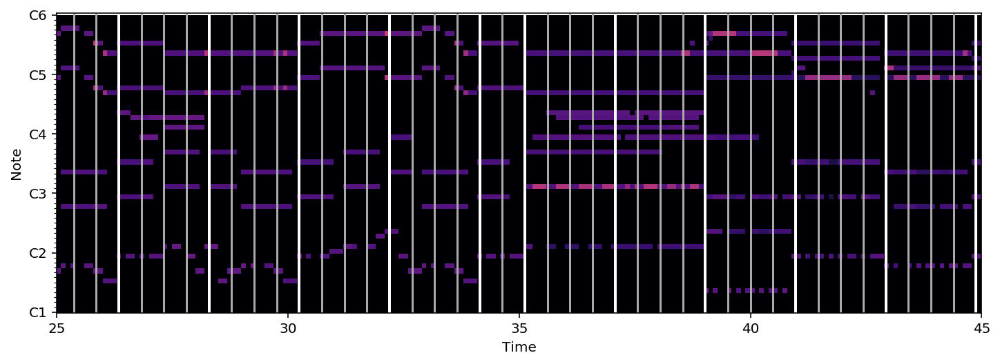

In [12]:
beats = pm.get_beats()
downbeats = pm.get_downbeats()
plt.figure(figsize=(12,4))
plot_piano_roll(pm, 24,84)
ymin, ymax = plt.ylim()
mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
plt.xlim(25,45)

Text(0,0.5,'Proportion')

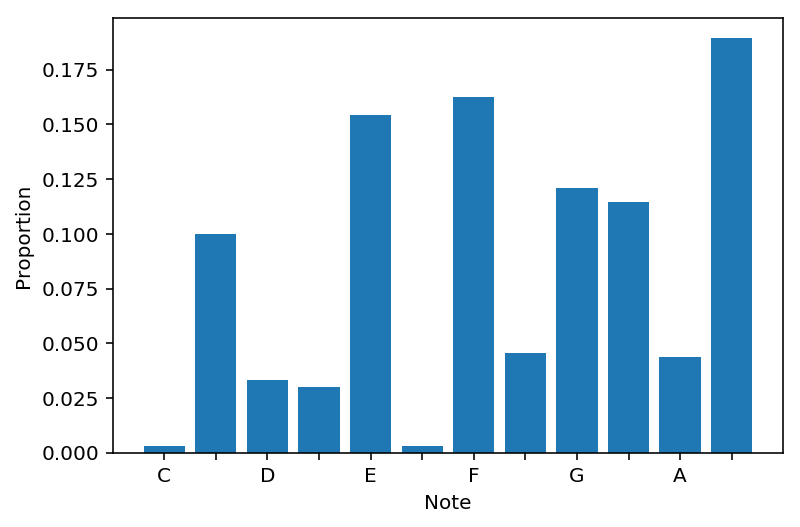

In [13]:
plt.bar(np.arange(12),pm.get_pitch_class_histogram())
plt.xticks(np.arange(12),['C','','D','','E','','F','','G','','A','','B'])
plt.xlabel('Note')
plt.ylabel('Proportion')

### Music21

In [24]:
fp = midi_file
mf = midi.MidiFile()
mf.open(str(fp))
mf.read()
mf.close()
print(len(mf.tracks))
s = midi.translate.midiFileToStream(mf)
print(len(s.flat.notesAndRests))

1
4025


In [14]:
dir(note)

['GeneralNote',
 'Lyric',
 'LyricException',
 'NotRest',
 'NotRestException',
 'Note',
 'NoteException',
 'Rest',
 'SpacerRest',
 'Test',
 'TestExternal',
 'Unpitched',
 '_DOC_ORDER',
 '_MOD',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'base',
 'beam',
 'common',
 'copy',
 'duration',
 'environLocal',
 'environment',
 'exceptions21',
 'expressions',
 'interval',
 'noteheadTypeNames',
 'pitch',
 'stemDirectionNames',
 'style',
 'tie',
 'unittest',
 'volume']

In [15]:
f = note.Note('F5')

In [16]:
f.pitch.frequency

698.456462866008

In [19]:
r = note.Rest(type='whole')

In [20]:
r.show()

SubConverterException: To create PNG files directly from MusicXML you need to download MuseScore and put a link to it in your .music21rc via Environment.

In [17]:
f.show('midi')

In [18]:
converter.parse('tinynotation: 3/4 c4 d8 f g16 a g f#').show()

SubConverterException: To create PNG files directly from MusicXML you need to download MuseScore and put a link to it in your .music21rc via Environment.

### Librosa